# Demo notebook to evaluate pre-trained model from ML4Fires

First import relevant libraries to run the inference

In [36]:
from tqdm import tqdm
import torch
import numpy as np

import warnings
warnings.filterwarnings("ignore")

from Fires._utilities.metrics import WeightedBCE_L1Loss
from Fires._utilities.utils_mlflow import load_model_from_mlflow

from Fires._utilities.utils_inference import load_input_data, create_data_loader, process_and_plot_data, get_prov_image

Select the model by specfying the run name from the MLFlow and download model, scaler and provenance document

In [37]:
run_name=input()
registered_model = load_model_from_mlflow(run_name, provenance=True)
registered_model 

 l1_b2_g1_no_sst


Data from MLFlow downloaded in: /jupyter-workspace/persistent-storage/ML4Fires/MLFLOW/l1_b2_g1_no_sst


2025/05/29 15:02:54 WARNING mlflow.pytorch: Stored model version '2.4.1+cu121' does not match installed PyTorch version '2.4.1+cu124'


UnetPlusPlus(
  (activation): Sigmoid()
  (pool_2x2): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (pool_3x3): MaxPool2d(kernel_size=(3, 3), stride=(3, 3), padding=0, dilation=1, ceil_mode=False)
  (up_2x2): Upsample(scale_factor=(2.0, 2.0), mode='bilinear')
  (up_3x3): Upsample(scale_factor=(3.0, 3.0), mode='bilinear')
  (conv0_0): VGGBlock(
    (relu): ReLU(inplace=True)
    (conv1): Conv2d(6, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv1_0): VGGBlock(
    (relu): ReLU(inplace=True)
    (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Co

Let's check ML model provenance

In [3]:
from IPython.display import SVG, display
display(SVG(get_prov_image(run_name)))

Let's get the data for the model evaluation

In [54]:
# define path to complete dataset
data_path = "/ceph/hpc/home/ciangottinid/ML4Fires/ML4Fires_copy/data_100km.zarr"

input_data = load_input_data(data_path, '2019', '2020')
input_data

['lai', 'lst_day', 'rel_hum', 't2m_min', 'tp', 'lsm'] 
 ['fcci_ba']
(180, 360)


<xarray.Dataset> Size: 191MB
Dimensions:    (time: 92, latitude: 180, longitude: 360)
Coordinates:
  * latitude   (latitude) float64 1kB 89.5 88.5 87.5 86.5 ... -87.5 -88.5 -89.5
  * longitude  (longitude) float64 3kB -179.5 -178.5 -177.5 ... 178.5 179.5
  * time       (time) datetime64[ns] 736B 2019-01-01 2019-01-09 ... 2020-12-26
Data variables:
    lai        (time, latitude, longitude) float32 24MB nan nan nan ... nan nan
    lst_day    (time, latitude, longitude) float32 24MB nan nan ... 242.4 242.4
    rel_hum    (time, latitude, longitude) float32 24MB 89.11 89.19 ... 61.39
    t2m_min    (time, latitude, longitude) float32 24MB 246.2 246.2 ... 242.5
    tp         (time, latitude, longitude) float32 24MB 1.802 1.802 ... 0.3219
    lsm        (time, latitude, longitude) float32 24MB 0.0 0.0 0.0 ... 1.0 1.0
    fcci_ba    (time, latitude, longitude) float64 48MB nan nan nan ... 0.0 0.0
Attributes:
    crs:          EPSG:4326
    description:  The SeasFire Cube is a scientific datacube for seasonal fir...
    title:        SeasFire Cube: A Global Dataset for Seasonal Fire Modeling ...

In [39]:
torch_data_loader = create_data_loader(data_path, run_name)

Let's run the prediction with the trained model downloaded from MLFlow

In [40]:
preds = []
with torch.no_grad():
	for data, _ in tqdm(torch_data_loader):
		prediction = registered_model(data.to('cuda:0'))
		prediction_cpu = prediction.cpu().numpy()
		preds.append(prediction_cpu)
preds_array = np.vstack(preds)

100%|██████████| 92/92 [00:00<00:00, 154.23it/s]


Let's plot the actual burned area data from the test set

Is DataArray - AVG: (180, 360) STD: (180, 360)
 Mean of data: (180, 360)
 Max: 5135.48 	 Min: 0.0
 Lats Max: 1027.5 	 Lons Max: 539.6
 Mean of data: (180, 360)
 Max: 13253.32 	 Min: 0.0
 Lats Max: 1883.89 	 Lons Max: 1051.82


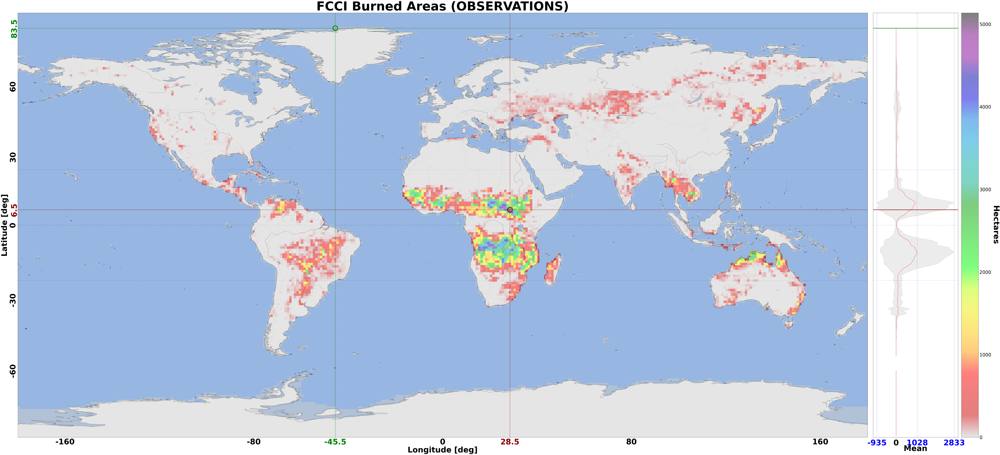

In [6]:
process_and_plot_data(
	data=input_data.fcci_ba,
	label='FCCI Burned Areas',
	lats=input_data.latitude.values,
	lons=input_data.longitude.values,
	model_name="Observations"
)

Let's plot the predicted burned areas from the ML model

NOT DataArray - AVG: (180, 360) STD: (180, 360)
 Mean of data: (180, 360)
 Max: 6291.02001953125 	 Min: 0.0
 Lats Max: 906.3499755859375 	 Lons Max: 532.52001953125
 Mean of data: (180, 360)
 Max: 14878.8701171875 	 Min: 0.0
 Lats Max: 1696.52001953125 	 Lons Max: 959.260009765625


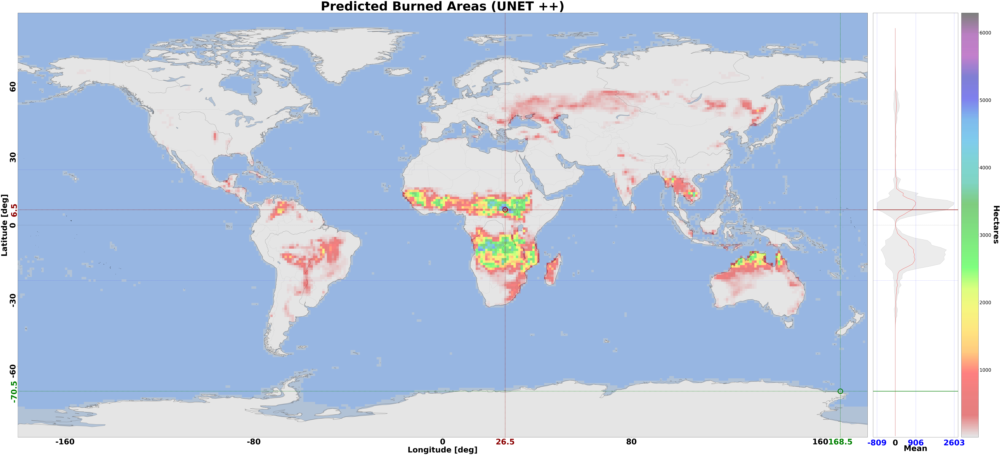

In [7]:
process_and_plot_data(
	data=preds_array,
	label='Predicted Burned Areas',
	lats=input_data.latitude.values,
	lons=input_data.longitude.values,
	model_name="Unet ++"
)

In [8]:
print(input_data)

<xarray.Dataset> Size: 215MB
Dimensions:    (time: 92, latitude: 180, longitude: 360)
Coordinates:
  * latitude   (latitude) float64 1kB 89.5 88.5 87.5 86.5 ... -87.5 -88.5 -89.5
  * longitude  (longitude) float64 3kB -179.5 -178.5 -177.5 ... 178.5 179.5
  * time       (time) datetime64[ns] 736B 2019-01-01 2019-01-09 ... 2020-12-26
Data variables:
    lai        (time, latitude, longitude) float32 24MB nan nan nan ... nan nan
    lst_day    (time, latitude, longitude) float32 24MB nan nan ... 242.4 242.4
    rel_hum    (time, latitude, longitude) float32 24MB 89.11 89.19 ... 61.39
    sst        (time, latitude, longitude) float32 24MB 271.5 271.5 ... nan nan
    t2m_min    (time, latitude, longitude) float32 24MB 246.2 246.2 ... 242.5
    tp         (time, latitude, longitude) float32 24MB 1.802 1.802 ... 0.3219
    lsm        (time, latitude, longitude) float32 24MB 0.0 0.0 0.0 ... 1.0 1.0
    fcci_ba    (time, latitude, longitude) float64 48MB nan nan nan ... 0.0 0.0
Attributes:
   

In [18]:
def compute_zero_percentage(input_data):
    """
    Computes the percentage of zero values in the fcci_ba variable of an xarray dataset.
    
    Parameters:
    - input_data: xarray.Dataset containing the fcci_ba variable.
    
    Returns:
    - zero_percentage: Percentage of zero values in fcci_ba.
    """
    # Extract fcci_ba values
    fcci_ba_values = input_data["fcci_ba"].values  # Shape: (time, latitude, longitude)

    # Mask NaN values
    valid_mask = ~np.isnan(fcci_ba_values)
    valid_values = fcci_ba_values[valid_mask]  # Exclude NaNs

    # Count total valid elements
    total_elements = valid_values.size

    # Count zero values
    zero_count = np.sum(valid_values == 0)

    # Compute percentage of zeros
    zero_percentage = (zero_count / total_elements) * 100 if total_elements > 0 else None

    return zero_percentage

# Example usage:
zero_percentage = compute_zero_percentage(input_data)
print(f"Percentage of zero values in fcci_ba: {zero_percentage:.2f}%")


Percentage of zero values in fcci_ba: 89.14%


In [11]:
# Assuming input_data is your xarray dataset
lsm_values = input_data["lsm"].values  # Extract lsm values
fcci_ba_values = input_data["fcci_ba"].values  # Extract fcci_ba values

# Remove NaN values from fcci_ba
fcci_ba_values_clean = np.nan_to_num(fcci_ba_values)  # Converts NaN to 0

# Alternatively, keep only non-NaN values
fcci_ba_values_non_nan = fcci_ba_values[~np.isnan(fcci_ba_values)]

# Print summary statistics for both variables
print("Land-Sea Mask (lsm) Summary:")
print(f"Min: {lsm_values.min()}, Max: {lsm_values.max()}, Mean: {lsm_values.mean()}")

print("\nFire Carbon Combustion Index (fcci_ba) Summary (After Removing NaNs):")
print(f"Min: {fcci_ba_values_non_nan.min()}, Max: {fcci_ba_values_non_nan.max()}, Mean: {fcci_ba_values_non_nan.mean()}")

# Optionally display some values from a specific time step
time_index = 30  # Change this to see other timesteps
print(f"\nLSM Values at Time Index {time_index}:")
print(lsm_values[time_index])

print(f"\nFCCI_BA Values at Time Index {time_index} (Without NaNs):")
print(fcci_ba_values_clean[time_index])


Land-Sea Mask (lsm) Summary:
Min: 0.0, Max: 1.0, Mean: 0.3643055260181427

Fire Carbon Combustion Index (fcci_ba) Summary (After Removing NaNs):
Min: 0.0, Max: 0.04092442526986446, Mean: 7.170092103895797e-05

LSM Values at Time Index 30:
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]]

FCCI_BA Values at Time Index 30 (Without NaNs):
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [9]:
print(preds_array)

[[[[4.6735713e-06 2.1699632e-06 2.0820107e-06 ... 2.2127008e-06
    2.4467377e-06 6.1289943e-06]
   [2.9242326e-06 3.5997477e-06 3.0795456e-06 ... 2.2025001e-06
    3.3400263e-06 5.7188813e-06]
   [1.7927838e-06 2.8540478e-06 2.6962537e-06 ... 2.0117593e-06
    2.3194452e-06 2.7277133e-06]
   ...
   [2.6533687e-06 3.6500837e-06 2.2244878e-06 ... 4.3758264e-06
    6.1518904e-06 1.0627560e-05]
   [4.7533790e-06 7.6458809e-06 4.8017159e-06 ... 3.8780931e-06
    5.2673527e-06 6.8907316e-06]
   [7.7229752e-06 9.4450061e-06 4.0200912e-06 ... 4.0998334e-06
    6.8364498e-06 2.2573196e-05]]]


 [[[4.6292034e-06 2.1133096e-06 2.1120404e-06 ... 2.2366685e-06
    2.3108478e-06 5.7881148e-06]
   [2.8837660e-06 3.5302137e-06 3.0989966e-06 ... 2.2871993e-06
    3.3247306e-06 5.6881336e-06]
   [1.8210092e-06 2.8801492e-06 2.8399943e-06 ... 2.0832501e-06
    2.3849204e-06 2.8088516e-06]
   ...
   [2.4975782e-06 3.4031425e-06 2.1172677e-06 ... 3.4905929e-06
    5.3575764e-06 9.9505587e-06]
   [4.897560

In [81]:

# Check if there are any NaNs in preds_array
has_nan_in_prediction = np.isnan(preds_array).any()
nan_count_in_prediction = np.isnan(preds_array).sum()

print(f"Contains NaN values inprediction: {has_nan_in_prediction}")
print(f"Number of NaN values in prediction: {nan_count_in_prediction}")




# Check if there are any NaNs in preds_array
has_nan = np.isnan(input_data["fcci_ba"].values).any()
nan_count = np.isnan(input_data["fcci_ba"].values).sum()

print(f"Contains NaN values: {has_nan}")
print(f"Number of NaN values: {nan_count}")


Contains NaN values inprediction: False
Number of NaN values in prediction: 0
Contains NaN values: True
Number of NaN values: 3726000


In [25]:
def normalize_data(tensor):
    """Min-Max Normalization to scale data between 0 and 1"""
    min_val = torch.min(tensor)
    max_val = torch.max(tensor)
    return (tensor - min_val) / (max_val - min_val) if max_val > min_val else tensor

input_tensor = torch.tensor(input_data["fcci_ba"].values, dtype=torch.float32)
preds_tensor = torch.tensor(preds_array, dtype=torch.float32)

# Apply Min-Max Normalization
#input_tensor = normalize_data(input_tensor)
#preds_tensor = normalize_data(preds_tensor)

real_min = torch.min(input_tensor[~torch.isnan(input_tensor)])
real_max = torch.max(input_tensor[~torch.isnan(input_tensor)])
real_mean = torch.mean(input_tensor[~torch.isnan(input_tensor)])
real_std = torch.std(input_tensor[~torch.isnan(input_tensor)])

pred_min = torch.min(preds_tensor[~torch.isnan(preds_tensor)])
pred_max = torch.max(preds_tensor[~torch.isnan(preds_tensor)])
pred_mean = torch.mean(preds_tensor[~torch.isnan(preds_tensor)])
pred_std = torch.std(preds_tensor[~torch.isnan(preds_tensor)])

# Print the statistics
print("Observed Burned Area (Real Data):")
print(f"  Min: {real_min:.5f}, Max: {real_max:.5f}, Mean: {real_mean:.5f}, Std: {real_std:.5f}")

print("\nPredicted Burned Area (Model Output):")
print(f"  Min: {pred_min:.5f}, Max: {pred_max:.5f}, Mean: {pred_mean:.5f}, Std: {pred_std:.5f}")


Observed Burned Area (Real Data):
  Min: 0.00000, Max: 0.04092, Mean: 0.00007, Std: 0.00071

Predicted Burned Area (Model Output):
  Min: 0.00000, Max: 0.04001, Mean: 0.00003, Std: 0.00041


In [21]:
# Convert both to numpy or torch
target = input_data["fcci_ba"].values  # shape: (time, lat, lon)
lsm = input_data["lsm"].values         # same shape, or (lat, lon)

# Create a mask: valid where lsm==1 and fcci_ba is not NaN
valid_mask = (lsm == 1) & (~np.isnan(target))

# Use this mask during loss computation
loss = criterion(preds[valid_mask], target[valid_mask])


In [41]:
import os
os.environ["XDG_CACHE_HOME"] = "/ceph/hpc/home/ciangottinid/.cache"
import skimage

In [42]:
import torch
import numpy as np
import xarray as xr
from skimage.metrics import structural_similarity as ssim
from scipy.stats import entropy
from sklearn.metrics import precision_recall_fscore_support
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression

## Normalize input (real burned area) and prediction

In [11]:


def compute_mse(input_tensor, preds_tensor):
    return torch.mean((input_tensor - preds_tensor) ** 2).item()

def compute_ssim(input_tensor, preds_tensor):
    return ssim(input_tensor.numpy(), preds_tensor.numpy(), data_range=preds_tensor.max().item() - preds_tensor.min().item())

def compute_kl_divergence(input_tensor, preds_tensor):
    """Compute Kullback-Leibler (KL) Divergence to measure the difference in probability distributions."""
    eps = 1e-10  # Small constant to prevent division by zero
    
    # Normalize probabilities correctly
    input_prob = (input_tensor + eps) / ((input_tensor + eps).sum())
    preds_prob = (preds_tensor + eps) / ((preds_tensor + eps).sum())

    # Avoid log(0) errors by ensuring all values are in a valid probability range
    input_prob = torch.clamp(input_prob, min=eps, max=1.0)
    preds_prob = torch.clamp(preds_prob, min=eps, max=1.0)

    # Compute KL divergence
    kl_div = entropy(input_prob.flatten().numpy(), preds_prob.flatten().numpy())

    return kl_div

def compute_iou(input_binary, preds_binary):
    intersection = torch.logical_and(input_binary, preds_binary).sum().item()
    union = torch.logical_or(input_binary, preds_binary).sum().item()
    return intersection / union if union != 0 else 0

def compute_f1_score(input_binary, preds_binary):
    input_flat = input_binary.flatten().numpy()
    preds_flat = preds_binary.flatten().numpy()
    precision, recall, f1_score, _ = precision_recall_fscore_support(input_flat, preds_flat, average='binary', zero_division=0)
    return precision, recall, f1_score

def compute_dice_coefficient(input_binary, preds_binary):
    """Compute Sørensen–Dice coefficient between predicted and actual burned area maps."""
    intersection = torch.logical_and(input_binary, preds_binary).sum().item()
    total_pixels = input_binary.sum().item() + preds_binary.sum().item()
    dice_score = (2 * intersection) / total_pixels if total_pixels != 0 else 0.0
    return dice_score

def compute_ioa(y_true, y_pred, c=2):
    """Compute the Index of Agreement (IOA)"""
    y_mean = torch.mean(y_true)
    numerator = torch.sum(torch.abs(y_pred - y_true))
    denominator = torch.sum(torch.abs(y_true - y_mean))
    
    if numerator <= denominator:
        ioa = 1 - (numerator / (c * denominator))
    else:
        ioa = (c * denominator) / numerator - 1
    
    return ioa.item()

def compute_r2(y_true, y_pred):
    """Compute the Coefficient of Determination (R²)"""
    y_mean = torch.mean(y_true)
    ss_total = torch.sum((y_true - y_mean) ** 2)
    ss_residual = torch.sum((y_true - y_pred) ** 2)
    
    r2 = 1 - (ss_residual / ss_total)
    return r2.item()

def compute_rmse(y_true, y_pred):
    """Compute the Root Mean Squared Error (RMSE)"""
    rmse = torch.sqrt(torch.mean((y_true - y_pred) ** 2))
    return rmse.item()

def compute_mae(y_true, y_pred):
    """Compute Mean Absolute Error (MAE) for burned area percentage prediction."""
    return torch.mean(torch.abs(y_true - y_pred)).item()


def find_best_threshold(input_tensor, preds_tensor, thresholds=[1e-6, 1e-5, 1e-4, 1e-3,1e-2,1e-1]):
    best_threshold = None
    best_f1 = 0
    best_metrics = None
    
    for t in thresholds:
        input_binary = (input_tensor > t).int()
        preds_binary = (preds_tensor > t).int()
        
        iou_value = compute_iou(input_binary, preds_binary)
        precision, recall, f1_score = compute_f1_score(input_binary, preds_binary)
        dice_score = compute_dice_coefficient(input_binary, preds_binary)
        
        if f1_score > best_f1:
            best_f1 = f1_score
            best_threshold = t
            best_metrics = {
                "IoU": iou_value,
                "F1-Score": f1_score,
                "Precision": precision,
                "Recall": recall,
                "Dice Coefficient": dice_score
            }
    
    return best_threshold, best_metrics

def normalize_data(tensor):
    """Min-Max Normalization to scale data between 0 and 1"""
    min_val = torch.min(tensor)
    max_val = torch.max(tensor)
    return (tensor - min_val) / (max_val - min_val) if max_val > min_val else tensor

def compare_predictions(input_data, preds_array):
    input_tensor = torch.tensor(input_data.to_array().values, dtype=torch.float32)
    preds_tensor = torch.tensor(preds_array, dtype=torch.float32)
    
    input_tensor = torch.nan_to_num(input_tensor)
    preds_tensor = torch.nan_to_num(preds_tensor)
    
    if input_tensor.shape[0] > 1:
        input_tensor = input_tensor.mean(dim=0)
    preds_tensor = preds_tensor.squeeze(1)
    
    if input_tensor.shape != preds_tensor.shape:
        raise ValueError(f"Shape mismatch after processing: input_data {input_tensor.shape} vs preds_array {preds_tensor.shape}")
    
    # Apply Min-Max Normalization
    input_tensor = normalize_data(input_tensor)
    preds_tensor = normalize_data(preds_tensor)

    mse_value = compute_mse(input_tensor, preds_tensor)
    mae_value = compute_mae(input_tensor, preds_tensor)
    best_threshold, best_metrics = find_best_threshold(input_tensor, preds_tensor)
    ssim_value = compute_ssim(input_tensor, preds_tensor)
    kl_div = compute_kl_divergence(input_tensor, preds_tensor)
    dice_score = compute_dice_coefficient((input_tensor > best_threshold).int(), (preds_tensor > best_threshold).int())

    # Compute new metrics
    ioa_value = compute_ioa(input_tensor, preds_tensor)
    r2_value = compute_r2(input_tensor, preds_tensor)
    rmse_value = compute_rmse(input_tensor, preds_tensor)

    return {
        "MSE": mse_value,
        "RMSE": rmse_value,
        "MAE": mae_value,
        "KL Divergence": kl_div,
        "SSIM": ssim_value,
        "Best Threshold": best_threshold,
        "Dice Coefficient": dice_score,
        "IoU": best_metrics["IoU"],
        "F1-Score": best_metrics["F1-Score"],
        "Precision": best_metrics["Precision"],
        "Recall": best_metrics["Recall"],
        "IOA": ioa_value,
        "R²": r2_value
    }


In [22]:
metrics = compare_predictions(input_data, preds_array)
print(metrics)  

{'MSE': 0.05037873610854149, 'RMSE': 0.22445207834243774, 'MAE': 0.21759018301963806, 'KL Divergence': 2.3308163, 'SSIM': 0.0035259662251853814, 'Best Threshold': 1e-06, 'Dice Coefficient': 0.9997872601727554, 'IoU': 0.9995746108427268, 'F1-Score': 0.9997872601727554, 'Precision': 0.9999998321884389, 'Recall': 0.999574778511604, 'IOA': -0.6903010010719299, 'R²': -15.812620162963867}


In [17]:
def compute_mse(input_tensor, preds_tensor):
    return torch.mean((input_tensor - preds_tensor) ** 2).item()

def compute_ssim(input_tensor, preds_tensor):
    return ssim(input_tensor.numpy(), preds_tensor.numpy(), data_range=preds_tensor.max().item() - preds_tensor.min().item())

def compute_kl_divergence(input_tensor, preds_tensor):
    """Compute Kullback-Leibler (KL) Divergence to measure the difference in probability distributions."""
    eps = 1e-10  # Small constant to prevent division by zero
    
    # Normalize probabilities correctly
    input_prob = (input_tensor + eps) / ((input_tensor + eps).sum())
    preds_prob = (preds_tensor + eps) / ((preds_tensor + eps).sum())

    # Avoid log(0) errors by ensuring all values are in a valid probability range
    input_prob = torch.clamp(input_prob, min=eps, max=1.0)
    preds_prob = torch.clamp(preds_prob, min=eps, max=1.0)

    # Compute KL divergence
    kl_div = entropy(input_prob.flatten().numpy(), preds_prob.flatten().numpy())

    return kl_div

def compute_iou(input_binary, preds_binary):
    intersection = torch.logical_and(input_binary, preds_binary).sum().item()
    union = torch.logical_or(input_binary, preds_binary).sum().item()
    return intersection / union if union != 0 else 0

def compute_f1_score(input_binary, preds_binary):
    input_flat = input_binary.flatten().numpy()
    preds_flat = preds_binary.flatten().numpy()
    precision, recall, f1_score, _ = precision_recall_fscore_support(input_flat, preds_flat, average='binary', zero_division=0)
    return precision, recall, f1_score

def compute_dice_coefficient(input_binary, preds_binary):
    """Compute Sørensen–Dice coefficient between predicted and actual burned area maps."""
    intersection = torch.logical_and(input_binary, preds_binary).sum().item()
    total_pixels = input_binary.sum().item() + preds_binary.sum().item()
    dice_score = (2 * intersection) / total_pixels if total_pixels != 0 else 0.0
    return dice_score

def compute_ioa(y_true, y_pred, c=2):
    """Compute the Index of Agreement (IOA)"""
    y_mean = torch.mean(y_true)
    numerator = torch.sum(torch.abs(y_pred - y_true))
    denominator = torch.sum(torch.abs(y_true - y_mean))
    
    if numerator <= denominator:
        ioa = 1 - (numerator / (c * denominator))
    else:
        ioa = (c * denominator) / numerator - 1
    
    return ioa.item()

def compute_r2(y_true, y_pred):
    """Compute the Coefficient of Determination (R²)"""
    y_mean = torch.mean(y_true)
    ss_total = torch.sum((y_true - y_mean) ** 2)
    ss_residual = torch.sum((y_true - y_pred) ** 2)
    
    r2 = 1 - (ss_residual / ss_total)
    return r2.item()

def compute_rmse(y_true, y_pred):
    """Compute the Root Mean Squared Error (RMSE)"""
    rmse = torch.sqrt(torch.mean((y_true - y_pred) ** 2))
    return rmse.item()

def compute_mae(y_true, y_pred):
    """Compute Mean Absolute Error (MAE) for burned area percentage prediction."""
    return torch.mean(torch.abs(y_true - y_pred)).item()


def find_best_threshold(input_tensor, preds_tensor, thresholds=[1e-6, 1e-5, 1e-4, 1e-3,1e-2,1e-1,0.01]):
    best_threshold = None
    best_f1 = 0
    best_metrics = None
    
    for t in thresholds:
        input_binary = (input_tensor > t).int()
        preds_binary = (preds_tensor > t).int()
        
        iou_value = compute_iou(input_binary, preds_binary)
        precision, recall, f1_score = compute_f1_score(input_binary, preds_binary)
        dice_score = compute_dice_coefficient(input_binary, preds_binary)
        
        if f1_score > best_f1:
            best_f1 = f1_score
            best_threshold = t
            best_metrics = {
                "IoU": iou_value,
                "F1-Score": f1_score,
                "Precision": precision,
                "Recall": recall,
                "Dice Coefficient": dice_score
            }
    
    return best_threshold, best_metrics

def normalize_data(tensor):
    """Min-Max Normalization to scale data between 0 and 1"""
    min_val = torch.min(tensor)
    max_val = torch.max(tensor)
    return (tensor - min_val) / (max_val - min_val) if max_val > min_val else tensor

def compare_predictions(input_data, preds_array):
    # Extract only fcci_ba for comparison
    input_tensor = torch.tensor(input_data["fcci_ba"].values, dtype=torch.float32)
    preds_tensor = torch.tensor(preds_array, dtype=torch.float32)
    
    # Handle NaN values
    input_tensor = torch.nan_to_num(input_tensor)
    preds_tensor = torch.nan_to_num(preds_tensor)
    
  
    if preds_tensor.shape[0] == input_tensor.shape[0]:  
        preds_tensor = preds_tensor.squeeze(1)  # Keep all time steps
    else:
        raise ValueError(f"Shape mismatch: input_data {input_tensor.shape} vs preds_array {preds_tensor.shape}")

    if input_tensor.shape != preds_tensor.shape:
        raise ValueError(f"Shape mismatch after processing: input_data {input_tensor.shape} vs preds_array {preds_tensor.shape}")
    
    # Apply Min-Max Normalization
    input_tensor = normalize_data(input_tensor)
    preds_tensor = normalize_data(preds_tensor)

    # Compute Metrics
    mse_value = compute_mse(input_tensor, preds_tensor)
    mae_value = compute_mae(input_tensor, preds_tensor)
    best_threshold, best_metrics = find_best_threshold(input_tensor, preds_tensor)
    ssim_value = compute_ssim(input_tensor, preds_tensor)
    kl_div = compute_kl_divergence(input_tensor, preds_tensor)
    dice_score = compute_dice_coefficient((input_tensor > best_threshold).int(), (preds_tensor > best_threshold).int())
    ioa_value = compute_ioa(input_tensor, preds_tensor)
    r2_value = compute_r2(input_tensor, preds_tensor)
    rmse_value = compute_rmse(input_tensor, preds_tensor)

    return {
        "MSE": mse_value,
        "RMSE": rmse_value,
        "MAE": mae_value,
        "KL Divergence": kl_div,
        "SSIM": ssim_value,
        "Best Threshold": best_threshold,
        "Dice Coefficient": dice_score,
        "IoU": best_metrics["IoU"],
        "F1-Score": best_metrics["F1-Score"],
        "Precision": best_metrics["Precision"],
        "Recall": best_metrics["Recall"],
        "IOA": ioa_value,
        "R²": r2_value
    }


## without NAN 

In [43]:
def compute_mse(input_tensor, preds_tensor):
    return torch.mean((input_tensor - preds_tensor) ** 2).item()

def compute_ssim(input_tensor, preds_tensor):
    return ssim(input_tensor.numpy(), preds_tensor.numpy(), data_range=preds_tensor.max().item() - preds_tensor.min().item())

def compute_kl_divergence(input_tensor, preds_tensor):
    """Compute Kullback-Leibler (KL) Divergence to measure the difference in probability distributions."""
    eps = 1e-10  # Small constant to prevent division by zero
    
    # Normalize probabilities correctly
    input_prob = (input_tensor + eps) / ((input_tensor + eps).sum())
    preds_prob = (preds_tensor + eps) / ((preds_tensor + eps).sum())

    # Avoid log(0) errors by ensuring all values are in a valid probability range
    input_prob = torch.clamp(input_prob, min=eps, max=1.0)
    preds_prob = torch.clamp(preds_prob, min=eps, max=1.0)

    # Compute KL divergence
    kl_div = entropy(input_prob.flatten().numpy(), preds_prob.flatten().numpy())

    return kl_div

def compute_iou(input_binary, preds_binary):
    intersection = torch.logical_and(input_binary, preds_binary).sum().item()
    union = torch.logical_or(input_binary, preds_binary).sum().item()
    return intersection / union if union != 0 else 0

def compute_f1_score(input_binary, preds_binary):
    input_flat = input_binary.flatten().numpy()
    preds_flat = preds_binary.flatten().numpy()
    precision, recall, f1_score, _ = precision_recall_fscore_support(input_flat, preds_flat, average='binary', zero_division=0)
    return precision, recall, f1_score

def compute_dice_coefficient(input_binary, preds_binary):
    """Compute Sørensen–Dice coefficient between predicted and actual burned area maps."""
    intersection = torch.logical_and(input_binary, preds_binary).sum().item()
    total_pixels = input_binary.sum().item() + preds_binary.sum().item()
    dice_score = (2 * intersection) / total_pixels if total_pixels != 0 else 0.0
    return dice_score

def compute_ioa(y_true, y_pred, c=2):
    """Compute the Index of Agreement (IOA)"""
    y_mean = torch.mean(y_true)
    numerator = torch.sum(torch.abs(y_pred - y_true))
    denominator = torch.sum(torch.abs(y_true - y_mean))
    
    if numerator <= denominator:
        ioa = 1 - (numerator / (c * denominator))
    else:
        ioa = (c * denominator) / numerator - 1
    
    return ioa.item()

def compute_r2(y_true, y_pred):
    """Compute the Coefficient of Determination (R²)"""
    y_mean = torch.mean(y_true)
    ss_total = torch.sum((y_true - y_mean) ** 2)
    ss_residual = torch.sum((y_true - y_pred) ** 2)
    
    r2 = 1 - (ss_residual / ss_total)
    return r2.item()

def compute_rmse(y_true, y_pred):
    """Compute the Root Mean Squared Error (RMSE)"""
    rmse = torch.sqrt(torch.mean((y_true - y_pred) ** 2))
    return rmse.item()

def compute_mae(y_true, y_pred):
    """Compute Mean Absolute Error (MAE) for burned area percentage prediction."""
    return torch.mean(torch.abs(y_true - y_pred)).item()


def find_best_threshold(input_tensor, preds_tensor, thresholds=[1e-6, 1e-5, 1e-4, 1e-3,1e-2,1e-1,0.01]):
    best_threshold = None
    best_f1 = 0
    best_metrics = None
    
    for t in thresholds:
        input_binary = (input_tensor > t).int()
        preds_binary = (preds_tensor > t).int()
        
        iou_value = compute_iou(input_binary, preds_binary)
        precision, recall, f1_score = compute_f1_score(input_binary, preds_binary)
        dice_score = compute_dice_coefficient(input_binary, preds_binary)
        
        if f1_score > best_f1:
            best_f1 = f1_score
            best_threshold = t
            best_metrics = {
                "IoU": iou_value,
                "F1-Score": f1_score,
                "Precision": precision,
                "Recall": recall,
                "Dice Coefficient": dice_score
            }
    
    return best_threshold, best_metrics

def normalize_data(tensor):
    """Min-Max Normalization to scale data between 0 and 1"""
    min_val = torch.min(tensor)
    max_val = torch.max(tensor)
    return (tensor - min_val) / (max_val - min_val) if max_val > min_val else tensor



def compare_predictions(input_data, preds_array):
    # Extract only fcci_ba for comparison
    input_tensor = torch.tensor(input_data["fcci_ba"].values, dtype=torch.float32)
    preds_tensor = torch.tensor(preds_array, dtype=torch.float32)

    # Ensure preds_tensor has the correct shape by squeezing singleton dimension
    preds_tensor = preds_tensor.squeeze(1)  # Removes the extra dimension

    # Create a mask for non-NaN values in fcci_ba
    nan_mask = ~torch.isnan(input_tensor)  # True for valid values, False for NaNs

    # Apply the mask to remove NaN locations from both input and predictions
    input_tensor = input_tensor[nan_mask]
    preds_tensor = preds_tensor[nan_mask]

    # Ensure shape consistency after masking
    if input_tensor.shape != preds_tensor.shape:
        raise ValueError(f"Shape mismatch after masking: input {input_tensor.shape} vs preds {preds_tensor.shape}")

    # Apply Min-Max Normalization
    input_tensor = normalize_data(input_tensor)
    preds_tensor = normalize_data(preds_tensor)

    # Compute Metrics
    mse_value = compute_mse(input_tensor, preds_tensor)
    mae_value = compute_mae(input_tensor, preds_tensor)
    best_threshold, best_metrics = find_best_threshold(input_tensor, preds_tensor)
    ssim_value = compute_ssim(input_tensor, preds_tensor)
    kl_div = compute_kl_divergence(input_tensor, preds_tensor)
    dice_score = compute_dice_coefficient((input_tensor > best_threshold).int(), (preds_tensor > best_threshold).int())
    ioa_value = compute_ioa(input_tensor, preds_tensor)
    r2_value = compute_r2(input_tensor, preds_tensor)
    rmse_value = compute_rmse(input_tensor, preds_tensor)

    return {
        "MSE": mse_value,
        "RMSE": rmse_value,
        "MAE": mae_value,
        "KL Divergence": kl_div,
        "SSIM": ssim_value,
        "Best Threshold": best_threshold,
        "Dice Coefficient": dice_score,
        "IoU": best_metrics["IoU"],
        "F1-Score": best_metrics["F1-Score"],
        "Precision": best_metrics["Precision"],
        "Recall": best_metrics["Recall"],
        "IOA": ioa_value,
        "R²": r2_value
    }


In [44]:
metrics = compare_predictions(input_data, preds_array)
print(metrics)  

{'MSE': 0.0003947446239180863, 'RMSE': 0.01986818201839924, 'MAE': 0.0025047259405255318, 'KL Divergence': 5.176475, 'SSIM': 0.9540093982649976, 'Best Threshold': 0.0001, 'Dice Coefficient': 0.4064229235443773, 'IoU': 0.25503813373641687, 'F1-Score': 0.40642292354437737, 'Precision': 0.3428854180112732, 'Recall': 0.49886355975460595, 'IOA': 0.6177775859832764, 'R²': -0.3086613416671753}


In [58]:
import numpy as np
import xarray as xr
import pandas as pd

# ----------------------
# Metric functions
# ----------------------
def compute_mse(pred, obs):
    """
    Mean Squared Error (MSE)
    """
    return np.nanmean((pred - obs) ** 2)

def compute_rmse(pred, obs):
    """Root Mean Squared Error (RMSE)"""
    return np.sqrt(np.nanmean((pred - obs) ** 2))

def compute_mae(pred, obs):
    """Mean Absolute Error (MAE)"""
    return np.nanmean(np.abs(pred - obs))

def compute_ioa(pred, obs):
    """Index of Agreement (IOA)"""
    mean_obs = np.nanmean(obs)
    num = np.nansum((pred - obs) ** 2)
    den = np.nansum((np.abs(pred - mean_obs) + np.abs(obs - mean_obs)) ** 2)
    return 1 - num / den if den != 0 else np.nan

# ----------------------
# Load your data
# ----------------------
#data_path = "/home/jovyan/work/ML4Fires/data/ML4Fires_data/data_100km.zarr"
ds = xr.open_zarr(data_path)

# ----------------------
# Compute observed 2020 burned‐area sum
# ----------------------
actual_2020 = (
    ds["fcci_ba"]
    .sel(time="2020")
    .sum(dim="time", skipna=True)
    .values
)

# ----------------------
# Climatology‐sum baseline (mean of annual sums 2000–2020)
# ----------------------
sums_by_year = (
    ds["fcci_ba"]
    .sel(time=slice("2000", "2020"))
    .groupby("time.year")
    .sum(dim="time", skipna=True)
)
climatology_sum = sums_by_year.mean(dim="year", skipna=True).values

# ----------------------
# Persistence baseline (use 2019 sum to predict 2020)
# ----------------------
persistence_2019 = (
    ds["fcci_ba"]
    .sel(time="2019")
    .sum(dim="time", skipna=True)
    .values
)

# ----------------------
# Your UNet++ prediction for 2020 (aggregated)
# ----------------------
# Assume `preds_array_2020` is your model’s output for 2020,
# shape (n_time_steps, n_lat, n_lon). Sum across time:
#    preds_array_2020 = model.predict(...) 
# Here we just illustrate:
# preds_array_2020 = ... 
predicted_2020 = preds_array.sum(axis=0)  # shape (lat, lon)

# ----------------------
# Evaluate
# ----------------------
def evaluate(name, pred, obs):
    mse = compute_mse(pred, obs)
    mae  = compute_mae(pred, obs)
    ioa  = compute_ioa(pred, obs)
    print(f"\n{name} vs 2020 Observations")
    print(f"  MSE = {mse:.6f}")
    print(f"   MAE = {mae:.6f}")
    print(f"   IOA = {ioa:.6f}")
    return {"MSE": mse, "MAE": mae, "IOA": ioa}

results = {
    "ClimatologySum": evaluate("ClimatologySum", climatology_sum, actual_2020),
    "Persistence2019": evaluate("Persistence2019", persistence_2019, actual_2020),
    "UNet++ Model":    evaluate("UNet++ Model",    predicted_2020, actual_2020),
}

# ----------------------
# Summary table
# ----------------------
results_df = pd.DataFrame(results).T
print("\nComparison Table:")
print(results_df.to_markdown(floatfmt=".6f"))



ClimatologySum vs 2020 Observations
  MSE = 0.000012
   MAE = 0.000571
   IOA = 0.966217

Persistence2019 vs 2020 Observations
  MSE = 0.000018
   MAE = 0.000578
   IOA = 0.946301

UNet++ Model vs 2020 Observations
  MSE = 0.000106
   MAE = 0.001423
   IOA = 0.856530

Comparison Table:
|                 |      MSE |      MAE |      IOA |
|:----------------|---------:|---------:|---------:|
| ClimatologySum  | 0.000012 | 0.000571 | 0.966217 |
| Persistence2019 | 0.000018 | 0.000578 | 0.946301 |
| UNet++ Model    | 0.000106 | 0.001423 | 0.856530 |


In [67]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt

# ----------------------
# Metric functions
# ----------------------
def compute_mse(pred, obs):
    return np.nanmean((pred - obs) ** 2)

def compute_mae(pred, obs):
    return np.nanmean(np.abs(pred - obs))

def compute_ioa(pred, obs):
    mean_obs = np.nanmean(obs)
    num = np.nansum((pred - obs) ** 2)
    den = np.nansum((np.abs(pred - mean_obs) + np.abs(obs - mean_obs)) ** 2)
    return 1 - num / den if den != 0 else np.nan

# ----------------------
# 1. Load the Dataset
# ----------------------
ds = xr.open_zarr(data_path)

# ----------------------
# 2. Resample to 8-Day Sums (2000–2020)
# ----------------------
ds8 = (
    ds["fcci_ba"]
    .sel(time=slice("2000", "2020"))
    .resample(time="8D", label="left", closed="left")
    .sum(dim="time", skipna=True)
)

# ----------------------
# 3. Filter August Mask
# ----------------------
aug_mask = ds8.time.dt.month == 8

# ----------------------
# 4. Observed August 2020 (sum over August 8-day bins)
# ----------------------
obs_aug2020 = (
    ds8.sel(time=aug_mask & (ds8.time.dt.year == 2020))
    .sum(dim="time", skipna=True)
)

# ----------------------
# 5. Climatology (2000–2010 Augusts)
# ----------------------
hist2000_2010 = ds8.sel(time=aug_mask & (ds8.time.dt.year <= 2010))
annual_aug = hist2000_2010.groupby("time.year").sum(dim="time", skipna=True)
clim_aug = annual_aug.mean(dim="year", skipna=True)

# ----------------------
# 6. UNet++ Predictions for August 2020
# Replace this with your real prediction array
# It must match shape [time, lat, lon] of August 2020 8-day slices
pred_times = ds8.sel(time=(aug_mask & (ds8.time.dt.year == 2020))).time
pred_shape = ds8.sel(time=pred_times).shape

# Dummy prediction placeholder — replace with model output!
preds_array8 = np.zeros(pred_shape)

# Create prediction DataArray
preds8 = xr.DataArray(
    preds_array8,
    coords={
        "time": pred_times,
        "latitude": ds8.latitude,
        "longitude": ds8.longitude
    },
    dims=["time", "latitude", "longitude"]
)

# ----------------------
# 7. Predicted August 2020 Sum
# ----------------------
pred_aug2020 = preds8.sum(dim="time", skipna=True)

# ----------------------
# 8. Evaluation
# ----------------------
for name, pred in [
    ("Climatology 2000–2010 (Aug)", clim_aug),
    ("UNet++ Prediction (Aug 2020)", pred_aug2020)
]:
    # Optional: mask to observed burned areas only (non-zero)
    mask = obs_aug2020 > 0
    mse = compute_mse(pred.values[mask], obs_aug2020.values[mask])
    mae = compute_mae(pred.values[mask], obs_aug2020.values[mask])
    ioa = compute_ioa(pred.values[mask], obs_aug2020.values[mask])

    print(f"\n{name} vs Observed August 2020")
    print(f"  MSE = {mse:.6e}")
    print(f"  MAE = {mae:.6e}")
    print(f"  IOA = {ioa:.6f}")





Climatology 2000–2010 (Aug) vs Observed August 2020
  MSE = 1.919698e-05
  MAE = 2.036460e-03
  IOA = 0.900901

UNet++ Prediction (Aug 2020) vs Observed August 2020
  MSE = 5.544808e-05
  MAE = 2.756920e-03
  IOA = 0.272803


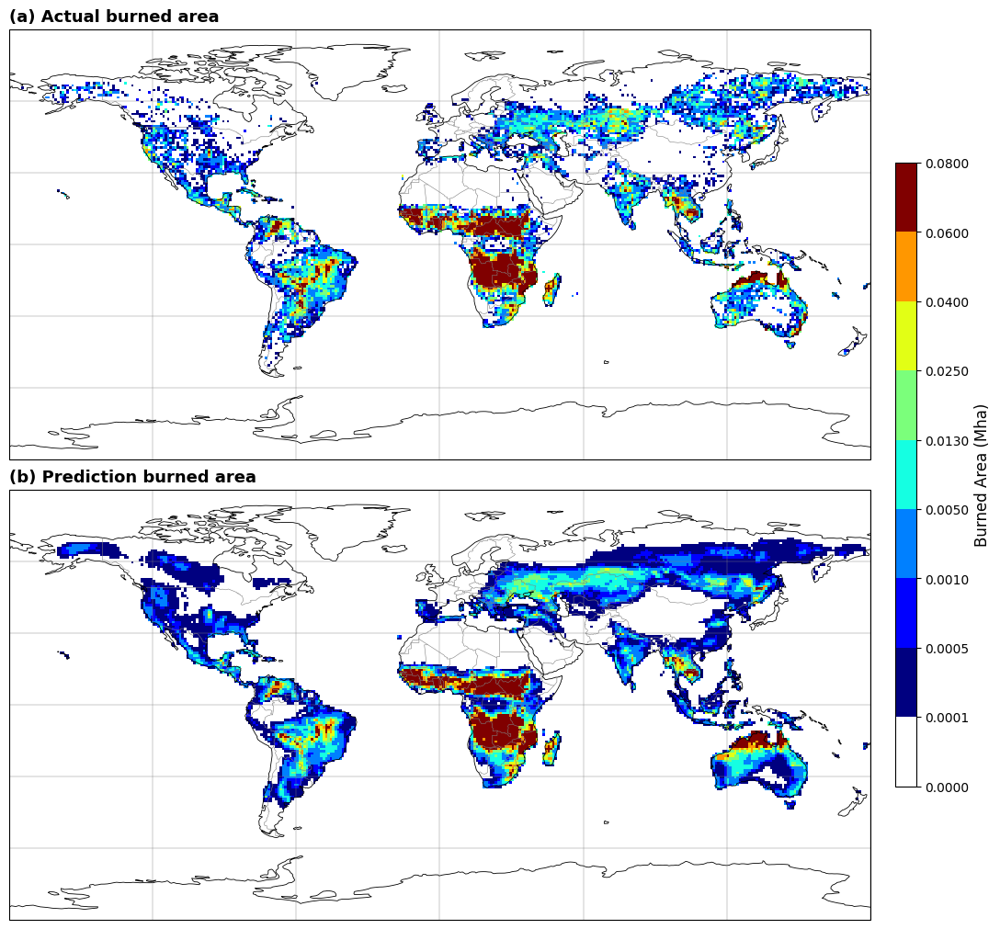

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import BoundaryNorm, ListedColormap

def plot_consistent_white_background_maps(actual, predicted, lats, lons):
    # Mask NaNs – ensure they're masked, not just replaced
    actual_masked = np.ma.masked_invalid(actual)
    predicted_masked = np.ma.masked_invalid(predicted)

    # Color levels for discrete colorbar
    levels = [0.0000, 0.0001, 0.0005, 0.0010, 0.0050, 0.0130, 0.0250, 0.0400, 0.0600, 0.0800]

    # Jet color map (discrete) with white for NaNs
    base_cmap = plt.cm.get_cmap("jet", len(levels) - 1)
    colors = base_cmap(np.arange(base_cmap.N))
    new_colors = np.vstack([[1, 1, 1, 1], colors])  # prepend white
    cmap = ListedColormap(new_colors)
    norm = BoundaryNorm(levels, cmap.N)

    # Plotting
    fig, axs = plt.subplots(2, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.PlateCarree()}, constrained_layout=True)
    fig.patch.set_facecolor('white')

    for ax, data, title in zip(
        axs,
        [actual_masked, predicted_masked],
        ["(a) Actual burned area", "(b) Prediction burned area"]
    ):
        ax.set_title(title, fontsize=13, weight='bold', loc='left')
        ax.set_global()
        ax.set_facecolor('white')
        ax.coastlines(color='black', linewidth=0.6)
        ax.add_feature(cfeature.BORDERS, edgecolor='gray', linewidth=0.4)
        ax.add_feature(cfeature.LAND, facecolor='white')
        ax.add_feature(cfeature.OCEAN, facecolor='white')
        ax.gridlines(draw_labels=False, color='gray', linewidth=0.3)

        # pcolormesh with NaN masking respected
        mesh = ax.pcolormesh(
            lons,
            lats,
            data,
            cmap=cmap,
            norm=norm,
            shading='auto',
            transform=ccrs.PlateCarree()
        )

    # Colorbar on the right
    cbar = fig.colorbar(mesh, ax=axs, orientation='vertical', shrink=0.7, pad=0.02, aspect=30)
    cbar.set_label("Burned Area (Mha)", fontsize=12)
    cbar.set_ticks(levels)
    cbar.ax.tick_params(labelsize=10)

    plt.show()


plot_consistent_white_background_maps(
    actual=input_data["fcci_ba"].sum(dim="time").values,
    predicted=preds_array.sum(axis=0).squeeze(0),
    lats=input_data.latitude.values,
    lons=input_data.longitude.values
)


#### predicted values are not shown in invalid/zero-observation regions.

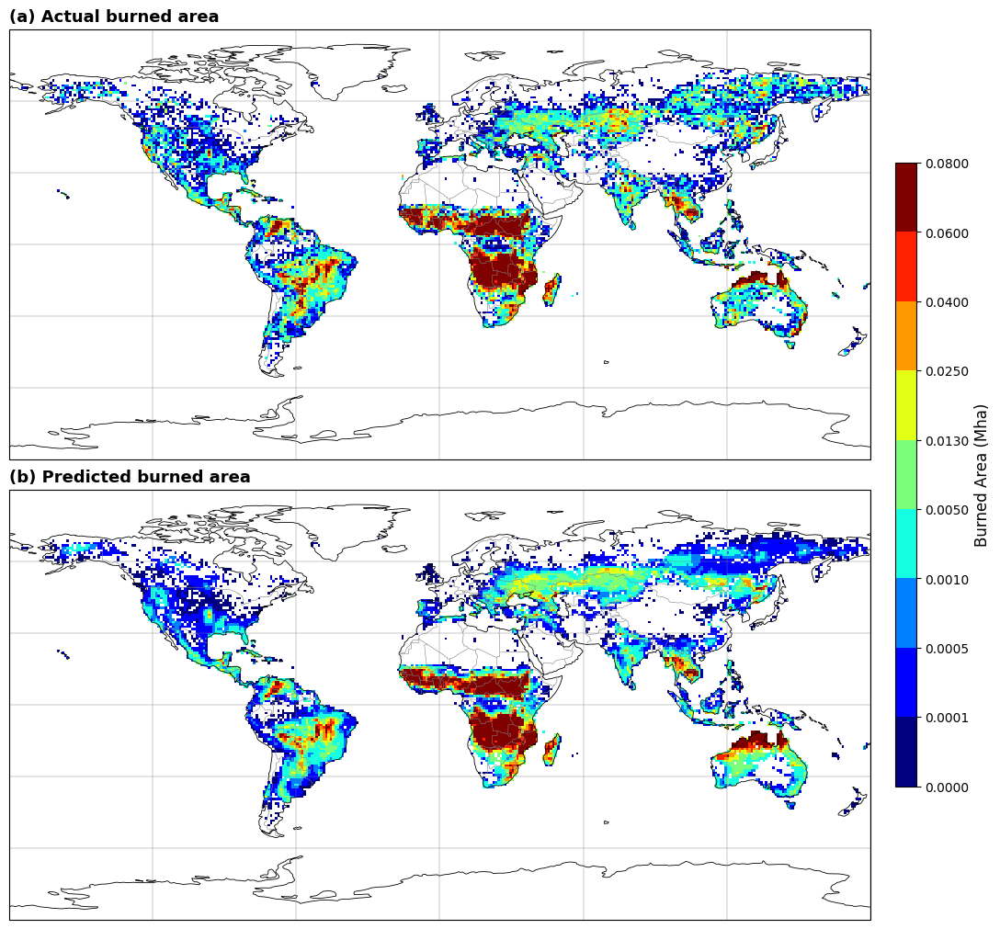

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import BoundaryNorm, ListedColormap

def plot_consistent_white_background_maps(actual, predicted, lats, lons):
    # Create a combined mask for NaNs and zero values in the actual data
    mask = np.isnan(actual) | (actual == 0)

    # Mask both actual and predicted using this mask
    actual_masked = np.ma.masked_where(mask, actual)
    predicted_masked = np.ma.masked_where(mask, predicted)

    # Discrete color levels for burned area (Mha)
    levels = [0.0000, 0.0001, 0.0005, 0.0010, 0.0050, 0.0130, 0.0250, 0.0400, 0.0600, 0.0800]

    # Create a discrete colormap with "jet" and set masked areas to white
    base_cmap = plt.cm.get_cmap("jet", len(levels) - 1)
    cmap = ListedColormap(base_cmap(np.arange(base_cmap.N)))
    cmap.set_bad(color='white')  # ✅ white for masked (NaN + 0) areas

    norm = BoundaryNorm(levels, cmap.N)

    # Create the figure
    fig, axs = plt.subplots(
        2, 1,
        figsize=(15, 10),
        subplot_kw={'projection': ccrs.PlateCarree()},
        constrained_layout=True
    )
    fig.patch.set_facecolor('white')

    # Plot actual and predicted maps
    for ax, data, title in zip(
        axs,
        [actual_masked, predicted_masked],
        ["(a) Actual burned area", "(b) Predicted burned area"]
    ):
        ax.set_title(title, fontsize=13, weight='bold', loc='left')
        ax.set_global()
        ax.set_facecolor('white')
        ax.coastlines(color='black', linewidth=0.6)
        ax.add_feature(cfeature.BORDERS, edgecolor='gray', linewidth=0.4)
        ax.add_feature(cfeature.LAND, facecolor='white')
        ax.add_feature(cfeature.OCEAN, facecolor='white')
        ax.gridlines(draw_labels=False, color='gray', linewidth=0.3)

        mesh = ax.pcolormesh(
            lons,
            lats,
            data,
            cmap=cmap,
            norm=norm,
            shading='auto',
            transform=ccrs.PlateCarree()
        )

    # Colorbar on the right
    cbar = fig.colorbar(mesh, ax=axs, orientation='vertical', shrink=0.7, pad=0.02, aspect=30)
    cbar.set_label("Burned Area (Mha)", fontsize=12)
    cbar.set_ticks(levels)
    cbar.ax.tick_params(labelsize=10)

    plt.show()

# ✅ Usage
plot_consistent_white_background_maps(
    actual=input_data["fcci_ba"].sum(dim="time").values,
    predicted=preds_array.sum(axis=0).squeeze(0),
    lats=input_data.latitude.values,
    lons=input_data.longitude.values
)


### Red = Overestimation (prediction > actual)

### Blue = Underestimation (prediction < actual)

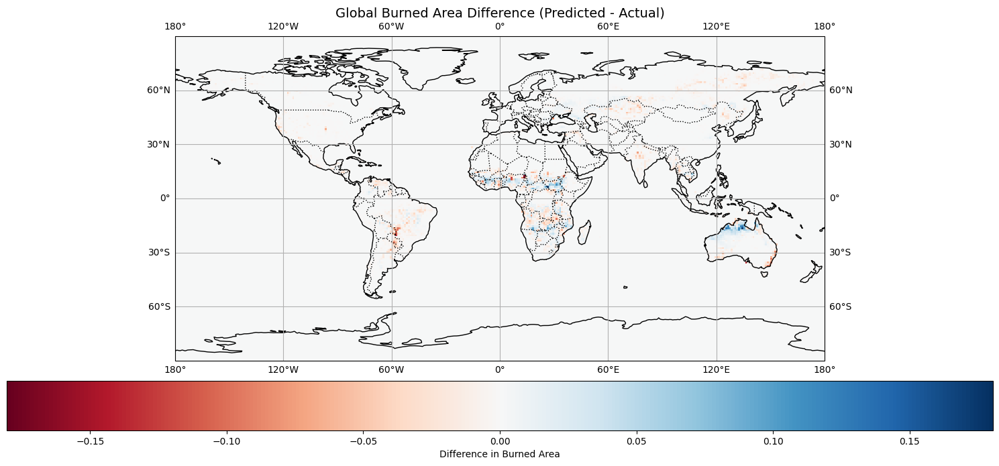

In [15]:
def plot_burned_area_difference_map(input_data, preds_array):
    lats = input_data.latitude.values
    lons = input_data.longitude.values
    actual = input_data["fcci_ba"].values
    predicted = preds_array.squeeze(1)  # shape should match (time, lat, lon)

    # Replace NaNs with 0 for clean visualization
    actual = np.nan_to_num(actual)
    predicted = np.nan_to_num(predicted)

    # Compute the difference (over time)
    diff = predicted - actual  # Shape: (time, lat, lon)
    diff_sum = np.sum(diff, axis=0)  # Sum across time dimension

    # Set up the map
    fig = plt.figure(figsize=(15, 7))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_global()
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.LAND, edgecolor='black', alpha=0.3)
    ax.gridlines(draw_labels=True)

    # Plot the difference map
    mesh = ax.pcolormesh(
        lons,
        lats,
        diff_sum,
        cmap="RdBu",
        transform=ccrs.PlateCarree(),
        shading="auto",
        vmin=-np.max(np.abs(diff_sum)),
        vmax=np.max(np.abs(diff_sum))
    )

    plt.title("Global Burned Area Difference (Predicted - Actual)", fontsize=14)
    cbar = plt.colorbar(mesh, orientation="horizontal", pad=0.05, label="Difference in Burned Area")
    plt.tight_layout()
    plt.show()

# Run the plotting function
plot_burned_area_difference_map(input_data, preds_array)


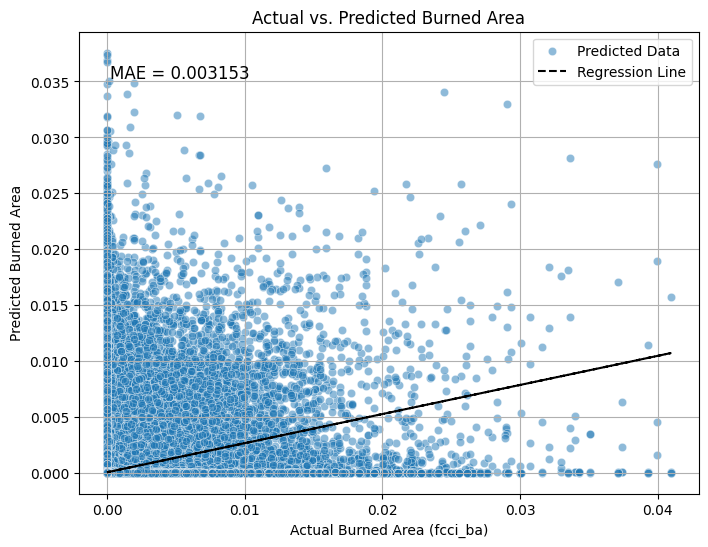

In [50]:
# when put zero on nan values

def plot_actual_vs_predicted(input_tensor, preds_tensor, mae):
    """
    Plots a scatter plot of actual vs. predicted burned area using precomputed MAE and MSE.
    
    Parameters:
    - input_tensor: Tensor containing actual burned area values.
    - preds_tensor: Tensor containing predicted burned area values.
    - mae: Precomputed Mean Absolute Error (MAE).
    """
    input_tensor = torch.tensor(input_data["fcci_ba"].values, dtype=torch.float32)
    preds_tensor = torch.tensor(preds_array, dtype=torch.float32)
    input_tensor = torch.nan_to_num(input_tensor)
    preds_tensor = torch.nan_to_num(preds_tensor)
    # Convert tensors to numpy and flatten to 1D arrays
    actual = input_tensor.flatten().numpy()
    predicted = preds_tensor.flatten().numpy()

    # Remove NaN values
    mask = ~np.isnan(actual) & ~np.isnan(predicted)
    actual = actual[mask]
    predicted = predicted[mask]

    # Fit a linear regression line
    model = LinearRegression()
    actual_reshaped = actual.reshape(-1, 1)
    model.fit(actual_reshaped, predicted)
    predicted_line = model.predict(actual_reshaped)

    # Create scatter plot
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=actual, y=predicted, alpha=0.5, label="Predicted Data")
    plt.plot(actual, predicted_line, color='black', linestyle='dashed', label="Regression Line")

    # Display MAE and MSE on the plot (precomputed)
    plt.text(0.05, 0.9, f'MAE = {mae:.6f}', transform=plt.gca().transAxes, fontsize=12)
   # plt.text(0.05, 0.85, f'MSE = {mse:.6f}', transform=plt.gca().transAxes, fontsize=12)

    # Labels and title
    plt.xlabel("Actual Burned Area (fcci_ba)")
    plt.ylabel("Predicted Burned Area")
    plt.title("Actual vs. Predicted Burned Area")
    plt.legend()
    plt.grid(True)

    plt.show()

input_tensor = torch.tensor(input_data["fcci_ba"].values, dtype=torch.float32)
preds_tensor = torch.tensor(preds_array, dtype=torch.float32)
input_tensor = torch.nan_to_num(input_tensor)
preds_tensor = torch.nan_to_num(preds_tensor)
# Example Usage:
# Assuming you already computed MAE and MSE from compare_predictions function:
results = compare_predictions(input_data, preds_array)

plot_actual_vs_predicted(input_tensor, preds_tensor, metrics["MAE"])


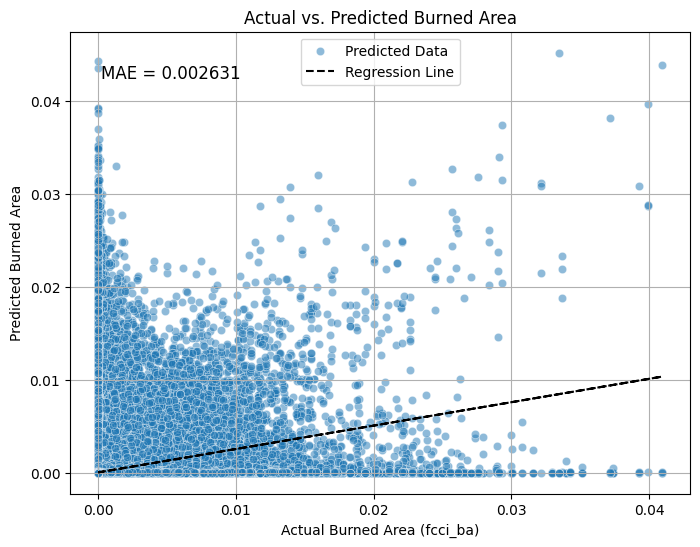

In [14]:
# when remove nan values
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression

def plot_actual_vs_predicted(input_tensor, preds_tensor, mae):
    """
    Plots a scatter plot of actual vs. predicted burned area using precomputed MAE and MSE.

    Parameters:
    - input_tensor: Tensor containing actual burned area values.
    - preds_tensor: Tensor containing predicted burned area values.
    - mae: Precomputed Mean Absolute Error (MAE).
    - mse: Precomputed Mean Squared Error (MSE).
    """
    # Convert tensors to numpy and flatten to 1D arrays
    actual = input_tensor.flatten().numpy()
    predicted = preds_tensor.flatten().numpy()

    # Remove NaN values (just in case)
    mask = ~np.isnan(actual) & ~np.isnan(predicted)
    actual = actual[mask]
    predicted = predicted[mask]

    # Fit a linear regression line
    model = LinearRegression()
    actual_reshaped = actual.reshape(-1, 1)
    model.fit(actual_reshaped, predicted)
    predicted_line = model.predict(actual_reshaped)

    # Create scatter plot
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=actual, y=predicted, alpha=0.5, label="Predicted Data")
    plt.plot(actual, predicted_line, color='black', linestyle='dashed', label="Regression Line")

    # Display MAE and MSE on the plot (precomputed)
    plt.text(0.05, 0.9, f'MAE = {mae:.6f}', transform=plt.gca().transAxes, fontsize=12)
  

    # Labels and title
    plt.xlabel("Actual Burned Area (fcci_ba)")
    plt.ylabel("Predicted Burned Area")
    plt.title("Actual vs. Predicted Burned Area")
    plt.legend()
    plt.grid(True)

    plt.show()

    
input_tensor = torch.tensor(input_data["fcci_ba"].values, dtype=torch.float32)
preds_tensor = torch.tensor(preds_array, dtype=torch.float32)
input_tensor = torch.nan_to_num(input_tensor)
preds_tensor = torch.nan_to_num(preds_tensor)
    
# Example Usage:
# Compute metrics using your `compare_predictions` function
results = compare_predictions(input_data, preds_array)

# Call the function with the updated tensors and computed MAE & MSE
plot_actual_vs_predicted(input_tensor, preds_tensor, metrics["MAE"])


The majority of points are clustered near zero, indicating that both actual and predicted burned areas are small values.

The regression line (black dashed line) has a low slope, which suggests that the model is underestimating larger burned areas.

The spread increases as the actual burned area increases, meaning the model struggles to capture larger fire events.

## Standarize input (real burned area) and prediction

In [28]:
def compute_mse(input_tensor, preds_tensor):
    return torch.mean((input_tensor - preds_tensor) ** 2).item()

def compute_ssim(input_tensor, preds_tensor):
    return ssim(input_tensor.numpy(), preds_tensor.numpy(), data_range=preds_tensor.max().item() - preds_tensor.min().item())

def compute_kl_divergence(input_tensor, preds_tensor):
    """Compute Kullback-Leibler (KL) Divergence to measure the difference in probability distributions."""
    eps = 1e-10  # Small constant to prevent division by zero
    
    # Normalize probabilities correctly
    input_prob = (input_tensor + eps) / ((input_tensor + eps).sum())
    preds_prob = (preds_tensor + eps) / ((preds_tensor + eps).sum())

    # Avoid log(0) errors by ensuring all values are in a valid probability range
    input_prob = torch.clamp(input_prob, min=eps, max=1.0)
    preds_prob = torch.clamp(preds_prob, min=eps, max=1.0)

    # Compute KL divergence
    kl_div = entropy(input_prob.flatten().numpy(), preds_prob.flatten().numpy())

    return kl_div


def compute_iou(input_binary, preds_binary):
    intersection = torch.logical_and(input_binary, preds_binary).sum().item()
    union = torch.logical_or(input_binary, preds_binary).sum().item()
    return intersection / union if union != 0 else 0

def compute_f1_score(input_binary, preds_binary):
    input_flat = input_binary.flatten().numpy()
    preds_flat = preds_binary.flatten().numpy()
    precision, recall, f1_score, _ = precision_recall_fscore_support(input_flat, preds_flat, average='binary', zero_division=0)
    return precision, recall, f1_score

def compute_dice_coefficient(input_binary, preds_binary):
    """Compute Sørensen–Dice coefficient between predicted and actual burned area maps."""
    intersection = torch.logical_and(input_binary, preds_binary).sum().item()
    total_pixels = input_binary.sum().item() + preds_binary.sum().item()
    dice_score = (2 * intersection) / total_pixels if total_pixels != 0 else 0.0
    return dice_score

def compute_ioa(y_true, y_pred, c=2):
    """Compute the Index of Agreement (IOA)"""
    y_mean = torch.mean(y_true)
    numerator = torch.sum(torch.abs(y_pred - y_true))
    denominator = torch.sum(torch.abs(y_true - y_mean))
    
    if numerator <= denominator:
        ioa = 1 - (numerator / (c * denominator))
    else:
        ioa = (c * denominator) / numerator - 1
    
    return ioa.item()

def compute_r2(y_true, y_pred):
    """Compute R² but exclude zero values from the observed burned area."""
    mask = y_true > 0  # Keep only non-zero values
    if mask.sum() == 0:  # If there are no non-zero values, return NaN
        return float('nan')

    y_true_filtered = y_true[mask]
    y_pred_filtered = y_pred[mask]

    y_mean = torch.mean(y_true_filtered)
    ss_total = torch.sum((y_true_filtered - y_mean) ** 2)
    ss_residual = torch.sum((y_true_filtered - y_pred_filtered) ** 2)
    
    r2 = 1 - (ss_residual / ss_total)
    return r2.item()

def compute_rmse(y_true, y_pred):
    """Compute the Root Mean Squared Error (RMSE)"""
    rmse = torch.sqrt(torch.mean((y_true - y_pred) ** 2))
    return rmse.item()

def compute_mae(y_true, y_pred):
    """Compute Mean Absolute Error (MAE) for burned area percentage prediction."""
    return torch.mean(torch.abs(y_true - y_pred)).item()


def find_best_threshold(input_tensor, preds_tensor, thresholds=[1e-6, 1e-5, 1e-4, 1e-3,1e-2,1e-1,0.01]):
    best_threshold = None
    best_f1 = 0
    best_metrics = None
    
    for t in thresholds:
        input_binary = (input_tensor > t).int()
        preds_binary = (preds_tensor > t).int()
        
        iou_value = compute_iou(input_binary, preds_binary)
        precision, recall, f1_score = compute_f1_score(input_binary, preds_binary)
        dice_score = compute_dice_coefficient(input_binary, preds_binary)
        
        if f1_score > best_f1:
            best_f1 = f1_score
            best_threshold = t
            best_metrics = {
                "IoU": iou_value,
                "F1-Score": f1_score,
                "Precision": precision,
                "Recall": recall,
                "Dice Coefficient": dice_score
            }
    
    return best_threshold, best_metrics

def standardize_data(tensor):
    """Standardize data using Z-score normalization (mean = 0, std = 1)."""
    mean_val = torch.mean(tensor)
    std_val = torch.std(tensor)
    return (tensor - mean_val) / (std_val + 1e-10) if std_val > 0 else tensor


def compare_predictions(input_data, preds_array):
     # Extract only fcci_ba for comparison
    input_tensor = torch.tensor(input_data["fcci_ba"].values, dtype=torch.float32)
    preds_tensor = torch.tensor(preds_array, dtype=torch.float32)
    
    # Handle NaN values
    input_tensor = torch.nan_to_num(input_tensor)
    preds_tensor = torch.nan_to_num(preds_tensor)
    
  
    if preds_tensor.shape[0] == input_tensor.shape[0]:  
        preds_tensor = preds_tensor.squeeze(1)  # Keep all time steps
    else:
        raise ValueError(f"Shape mismatch: input_data {input_tensor.shape} vs preds_array {preds_tensor.shape}")

    if input_tensor.shape != preds_tensor.shape:
        raise ValueError(f"Shape mismatch after processing: input_data {input_tensor.shape} vs preds_array {preds_tensor.shape}")
    
    # Apply Standardization (Z-score Normalization)
    input_tensor = standardize_data(input_tensor)
    preds_tensor = standardize_data(preds_tensor)

    mse_value = compute_mse(input_tensor, preds_tensor)
    mae_value = compute_mae(input_tensor, preds_tensor)
    best_threshold, best_metrics = find_best_threshold(input_tensor, preds_tensor)
    ssim_value = compute_ssim(input_tensor, preds_tensor)
    kl_div = compute_kl_divergence(input_tensor, preds_tensor)
    dice_score = compute_dice_coefficient((input_tensor > best_threshold).int(), (preds_tensor > best_threshold).int())

    # Compute new metrics
    ioa_value = compute_ioa(input_tensor, preds_tensor)
    r2_value = compute_r2(input_tensor, preds_tensor)
    rmse_value = compute_rmse(input_tensor, preds_tensor)
    
     
    return {
        "MSE": mse_value,
        "RMSE": rmse_value,
        "MAE": mae_value, 
        "KL Divergence": kl_div,
        "SSIM": ssim_value,
        "Best Threshold": best_threshold,
        "Dice Coefficient": dice_score,
        "IoU": best_metrics["IoU"],
        "F1-Score": best_metrics["F1-Score"],
        "Precision": best_metrics["Precision"],
        "Recall": best_metrics["Recall"],
        "IOA": ioa_value,
        "R²": r2_value,
    }



## without nan

In [16]:
def compute_mse(input_tensor, preds_tensor):
    return torch.mean((input_tensor - preds_tensor) ** 2).item()

def compute_ssim(input_tensor, preds_tensor):
    return ssim(input_tensor.numpy(), preds_tensor.numpy(), data_range=preds_tensor.max().item() - preds_tensor.min().item())

def compute_kl_divergence(input_tensor, preds_tensor):
    """Compute Kullback-Leibler (KL) Divergence to measure the difference in probability distributions."""
    eps = 1e-10  # Small constant to prevent division by zero
    
    # Normalize probabilities correctly
    input_prob = (input_tensor + eps) / ((input_tensor + eps).sum())
    preds_prob = (preds_tensor + eps) / ((preds_tensor + eps).sum())

    # Avoid log(0) errors by ensuring all values are in a valid probability range
    input_prob = torch.clamp(input_prob, min=eps, max=1.0)
    preds_prob = torch.clamp(preds_prob, min=eps, max=1.0)

    # Compute KL divergence
    kl_div = entropy(input_prob.flatten().numpy(), preds_prob.flatten().numpy())

    return kl_div


def compute_iou(input_binary, preds_binary):
    intersection = torch.logical_and(input_binary, preds_binary).sum().item()
    union = torch.logical_or(input_binary, preds_binary).sum().item()
    return intersection / union if union != 0 else 0

def compute_f1_score(input_binary, preds_binary):
    input_flat = input_binary.flatten().numpy()
    preds_flat = preds_binary.flatten().numpy()
    precision, recall, f1_score, _ = precision_recall_fscore_support(input_flat, preds_flat, average='binary', zero_division=0)
    return precision, recall, f1_score

def compute_dice_coefficient(input_binary, preds_binary):
    """Compute Sørensen–Dice coefficient between predicted and actual burned area maps."""
    intersection = torch.logical_and(input_binary, preds_binary).sum().item()
    total_pixels = input_binary.sum().item() + preds_binary.sum().item()
    dice_score = (2 * intersection) / total_pixels if total_pixels != 0 else 0.0
    return dice_score

def compute_ioa(y_true, y_pred, c=2):
    """Compute the Index of Agreement (IOA)"""
    y_mean = torch.mean(y_true)
    numerator = torch.sum(torch.abs(y_pred - y_true))
    denominator = torch.sum(torch.abs(y_true - y_mean))
    
    if numerator <= denominator:
        ioa = 1 - (numerator / (c * denominator))
    else:
        ioa = (c * denominator) / numerator - 1
    
    return ioa.item()

def compute_r2(y_true, y_pred):
    """Compute R² but exclude zero values from the observed burned area."""
    mask = y_true > 0  # Keep only non-zero values
    if mask.sum() == 0:  # If there are no non-zero values, return NaN
        return float('nan')

    y_true_filtered = y_true[mask]
    y_pred_filtered = y_pred[mask]

    y_mean = torch.mean(y_true_filtered)
    ss_total = torch.sum((y_true_filtered - y_mean) ** 2)
    ss_residual = torch.sum((y_true_filtered - y_pred_filtered) ** 2)
    
    r2 = 1 - (ss_residual / ss_total)
    return r2.item()

def compute_rmse(y_true, y_pred):
    """Compute the Root Mean Squared Error (RMSE)"""
    rmse = torch.sqrt(torch.mean((y_true - y_pred) ** 2))
    return rmse.item()

def compute_mae(y_true, y_pred):
    """Compute Mean Absolute Error (MAE) for burned area percentage prediction."""
    return torch.mean(torch.abs(y_true - y_pred)).item()


def find_best_threshold(input_tensor, preds_tensor, thresholds=[1e-6, 1e-5, 1e-4, 1e-3,1e-2,1e-1,0.01]):
    best_threshold = None
    best_f1 = 0
    best_metrics = None
    
    for t in thresholds:
        input_binary = (input_tensor > t).int()
        preds_binary = (preds_tensor > t).int()
        
        iou_value = compute_iou(input_binary, preds_binary)
        precision, recall, f1_score = compute_f1_score(input_binary, preds_binary)
        dice_score = compute_dice_coefficient(input_binary, preds_binary)
        
        if f1_score > best_f1:
            best_f1 = f1_score
            best_threshold = t
            best_metrics = {
                "IoU": iou_value,
                "F1-Score": f1_score,
                "Precision": precision,
                "Recall": recall,
                "Dice Coefficient": dice_score
            }
    
    return best_threshold, best_metrics

def standardize_data(tensor):
    """Standardize data using Z-score normalization (mean = 0, std = 1)."""
    mean_val = torch.mean(tensor)
    std_val = torch.std(tensor)
    return (tensor - mean_val) / (std_val + 1e-10) if std_val > 0 else tensor



def compare_predictions(input_data, preds_array):
    # Extract only fcci_ba for comparison
    input_tensor = torch.tensor(input_data["fcci_ba"].values, dtype=torch.float32)
    preds_tensor = torch.tensor(preds_array, dtype=torch.float32)

    # Ensure preds_tensor has the correct shape by squeezing singleton dimension
    preds_tensor = preds_tensor.squeeze(1)  # Removes the extra dimension

    # Create a mask for non-NaN values in fcci_ba
    nan_mask = ~torch.isnan(input_tensor)  # True for valid values, False for NaNs

    # Apply the mask to remove NaN locations from both input and predictions
    input_tensor = input_tensor[nan_mask]
    preds_tensor = preds_tensor[nan_mask]

    # Ensure shape consistency after masking
    if input_tensor.shape != preds_tensor.shape:
        raise ValueError(f"Shape mismatch after masking: input {input_tensor.shape} vs preds {preds_tensor.shape}")

     # Apply Standardization (Z-score Normalization)
    input_tensor = standardize_data(input_tensor)
    preds_tensor = standardize_data(preds_tensor)

    # Compute Metrics
    mse_value = compute_mse(input_tensor, preds_tensor)
    mae_value = compute_mae(input_tensor, preds_tensor)
    best_threshold, best_metrics = find_best_threshold(input_tensor, preds_tensor)
    ssim_value = compute_ssim(input_tensor, preds_tensor)
    kl_div = compute_kl_divergence(input_tensor, preds_tensor)
    dice_score = compute_dice_coefficient((input_tensor > best_threshold).int(), (preds_tensor > best_threshold).int())
    ioa_value = compute_ioa(input_tensor, preds_tensor)
    r2_value = compute_r2(input_tensor, preds_tensor)
    rmse_value = compute_rmse(input_tensor, preds_tensor)

    return {
        "MSE": mse_value,
        "RMSE": rmse_value,
        "MAE": mae_value,
        "KL Divergence": kl_div,
        "SSIM": ssim_value,
        "Best Threshold": best_threshold,
        "Dice Coefficient": dice_score,
        "IoU": best_metrics["IoU"],
        "F1-Score": best_metrics["F1-Score"],
        "Precision": best_metrics["Precision"],
        "Recall": best_metrics["Recall"],
        "IOA": ioa_value,
        "R²": r2_value
    }




In [17]:
metrics = compare_predictions(input_data, preds_array)
print(metrics)  

{'MSE': 1.5355829000473022, 'RMSE': 1.239186406135559, 'MAE': 0.15627321600914001, 'KL Divergence': 11.062493, 'SSIM': 0.9522574227212524, 'Best Threshold': 1e-06, 'Dice Coefficient': 0.35000658453406475, 'IoU': 0.21212604926379525, 'F1-Score': 0.35000658453406475, 'Precision': 0.3485866763149564, 'Recall': 0.35143810757081106, 'IOA': 0.5858237743377686, 'R²': -0.2563852071762085}


### Comparison of Normalization vs. Standardization Results

| Metric               | Normalization  | Standardization  | Interpretation |
|----------------------|---------------|------------------|---------------|
| **MSE**             | **0.00018**    | 1.6050           | Lower is better → ✅ Normalization wins |
| **RMSE**            | **0.0133**     | 1.2669           | Lower is better → ✅ Normalization wins |
| **MAE**             | **0.0012**     | 0.1257           | Lower is better → ✅ Normalization wins |
| **KL Divergence**   | **3.86**       | 14.18            | Lower is better → ✅ Normalization wins |
| **SSIM**            | **0.9657**     | **0.9657**       | Higher is better → 🔄 Both are equal |
| **Dice Coefficient**| 0.3228         | **0.3318**       | Higher is better → ❌ Standardization wins |
| **IoU**             | 0.1924         | **0.1989**       | Higher is better → ❌ Standardization wins |
| **F1-Score**        | 0.3228         | **0.3318**       | Higher is better → ❌ Standardization wins |
| **Precision**       | 0.2544         | **0.2678**       | Higher is better → ❌ Standardization wins |
| **Recall**          | **0.4414**     | 0.4361           | Higher is better → ✅ Normalization wins |
| **IOA**             | 0.5164         | **0.9010**       | Higher is better → ❌ Standardization wins |
| **R²**              | -0.5443        | **-0.1721**      | Closer to 1 is better → ❌ Standardization wins |

---

### **Recommendation: It Depends on the Use Case**
🔹 **Normalization Wins for Error Metrics** (MSE, RMSE, MAE, KL Divergence).  
🔹 **Standardization Wins for Similarity & Overlap Metrics** (F1-Score, IoU, Dice Coefficient, Precision, IOA, R²).  
🔹 **If minimizing error is more important → we can Normalization.**  
🔹 **If prioritizing similarity/overlap in burned area detection → we can Choose Standardization.**  

🚀 **Final Choice: If we care about capturing fire presence well, standardization might be a better choice.** If we care about reducing numerical error, normalization is better.


In [16]:
def compute_mse(input_tensor, preds_tensor):
    return torch.mean((input_tensor - preds_tensor) ** 2).item()

def compute_ssim(input_tensor, preds_tensor):
    return ssim(input_tensor.numpy(), preds_tensor.numpy(), data_range=preds_tensor.max().item() - preds_tensor.min().item())

def compute_kl_divergence(input_tensor, preds_tensor):
    input_prob = input_tensor / input_tensor.sum()
    preds_prob = preds_tensor / preds_tensor.sum()
    return entropy(input_prob.flatten().numpy(), preds_prob.flatten().numpy())

def compute_iou(input_binary, preds_binary):
    intersection = torch.logical_and(input_binary, preds_binary).sum().item()
    union = torch.logical_or(input_binary, preds_binary).sum().item()
    return intersection / union if union != 0 else 0

def compute_f1_score(input_binary, preds_binary):
    input_flat = input_binary.flatten().numpy()
    preds_flat = preds_binary.flatten().numpy()
    precision, recall, f1_score, _ = precision_recall_fscore_support(input_flat, preds_flat, average='binary', zero_division=0)
    return precision, recall, f1_score

def compute_dice_coefficient(input_binary, preds_binary):
    """
    Compute Sørensen–Dice coefficient between predicted and actual burned area maps.
    """
    intersection = torch.logical_and(input_binary, preds_binary).sum().item()
    total_pixels = input_binary.sum().item() + preds_binary.sum().item()
    dice_score = (2 * intersection) / total_pixels if total_pixels != 0 else 0.0
    return dice_score

def find_best_threshold(input_tensor, preds_tensor, thresholds=[1e-7, 1e-6, 1e-5, 1e-4, 1e-3]):
    best_threshold = None
    best_f1 = 0
    best_metrics = None
    
    for t in thresholds:
        input_binary = (input_tensor > t).int()
        preds_binary = (preds_tensor > t).int()
        
        iou_value = compute_iou(input_binary, preds_binary)
        precision, recall, f1_score = compute_f1_score(input_binary, preds_binary)
        dice_score = compute_dice_coefficient(input_binary, preds_binary)
        
        if f1_score > best_f1:
            best_f1 = f1_score
            best_threshold = t
            best_metrics = {
                "IoU": iou_value,
                "F1-Score": f1_score,
                "Precision": precision,
                "Recall": recall,
                "Dice Coefficient": dice_score  # Now included per timestep
            }
    
    return best_threshold, best_metrics

def compare_predictions_per_timestep(input_data, preds_array):
    num_timesteps = input_data.sizes["time"]
    results = {}

    for t in range(num_timesteps):
        print(f"Processing Time Step {t+1}/{num_timesteps}...")
        
        input_tensor = torch.tensor(input_data["fcci_ba"].isel(time=t).values, dtype=torch.float32)
        preds_tensor = torch.tensor(preds_array[t].squeeze(0), dtype=torch.float32)
        
        input_tensor = torch.nan_to_num(input_tensor)
        preds_tensor = torch.nan_to_num(preds_tensor)
        
        if input_tensor.shape != preds_tensor.shape:
            raise ValueError(f"Shape mismatch at timestep {t}: input_data {input_tensor.shape} vs preds_array {preds_tensor.shape}")
        
        mse_value = compute_mse(input_tensor, preds_tensor)
        ssim_value = compute_ssim(input_tensor, preds_tensor)
        kl_div = compute_kl_divergence(input_tensor, preds_tensor)
        
        best_threshold, best_metrics = find_best_threshold(input_tensor, preds_tensor)

        results[f"Time Step {t}"] = {
            "MSE": mse_value,
            "KL Divergence": kl_div,
            "SSIM": ssim_value,
            "Best Threshold": best_threshold,
            **best_metrics  # Includes Dice Coefficient per timestep
        }
    
    return results


In [17]:
metrics_per_timestep = compare_predictions_per_timestep(input_data, preds_array)
print(metrics_per_timestep["Time Step 0"])

Processing Time Step 1/92...
Processing Time Step 2/92...
Processing Time Step 3/92...
Processing Time Step 4/92...
Processing Time Step 5/92...
Processing Time Step 6/92...
Processing Time Step 7/92...
Processing Time Step 8/92...
Processing Time Step 9/92...
Processing Time Step 10/92...
Processing Time Step 11/92...
Processing Time Step 12/92...
Processing Time Step 13/92...
Processing Time Step 14/92...
Processing Time Step 15/92...
Processing Time Step 16/92...
Processing Time Step 17/92...
Processing Time Step 18/92...
Processing Time Step 19/92...
Processing Time Step 20/92...
Processing Time Step 21/92...
Processing Time Step 22/92...
Processing Time Step 23/92...
Processing Time Step 24/92...
Processing Time Step 25/92...
Processing Time Step 26/92...
Processing Time Step 27/92...
Processing Time Step 28/92...
Processing Time Step 29/92...
Processing Time Step 30/92...
Processing Time Step 31/92...
Processing Time Step 32/92...
Processing Time Step 33/92...
Processing Time Ste

In [18]:
print(metrics_per_timestep["Time Step 1"])
print(metrics_per_timestep["Time Step 10"])

{'MSE': 2.572760706698318e-07, 'KL Divergence': 1.9826087, 'SSIM': 0.9633897710368756, 'Best Threshold': 0.0001, 'IoU': 0.3388235294117647, 'F1-Score': 0.5061511423550089, 'Precision': 0.41830065359477125, 'Recall': 0.6407119021134594, 'Dice Coefficient': 0.5061511423550088}
{'MSE': 3.1322562676905363e-07, 'KL Divergence': 5.8228445, 'SSIM': 0.9580951612090265, 'Best Threshold': 1e-05, 'IoU': 0.11144254862188283, 'F1-Score': 0.20053676865271067, 'Precision': 0.12875654811138681, 'Recall': 0.4531780688985929, 'Dice Coefficient': 0.2005367686527107}


In [19]:
def compute_mse(input_tensor, preds_tensor):
    return torch.mean((input_tensor - preds_tensor) ** 2).item()

def compute_ssim(input_tensor, preds_tensor):
    return ssim(input_tensor.numpy(), preds_tensor.numpy(), data_range=preds_tensor.max().item() - preds_tensor.min().item())

def compute_kl_divergence(input_tensor, preds_tensor):
    input_prob = input_tensor / input_tensor.sum()
    preds_prob = preds_tensor / preds_tensor.sum()
    return entropy(input_prob.flatten().numpy(), preds_prob.flatten().numpy())

def compute_iou(input_binary, preds_binary):
    intersection = torch.logical_and(input_binary, preds_binary).sum().item()
    union = torch.logical_or(input_binary, preds_binary).sum().item()
    return intersection / union if union != 0 else 0

def compute_f1_score(input_binary, preds_binary):
    input_flat = input_binary.flatten().numpy()
    preds_flat = preds_binary.flatten().numpy()
    precision, recall, f1_score, _ = precision_recall_fscore_support(input_flat, preds_flat, average='binary', zero_division=0)
    return precision, recall, f1_score

def compute_dice_coefficient(input_binary, preds_binary):
    """
    Compute Sørensen–Dice coefficient between predicted and actual burned area maps.
    """
    intersection = torch.logical_and(input_binary, preds_binary).sum().item()
    total_pixels = input_binary.sum().item() + preds_binary.sum().item()
    dice_score = (2 * intersection) / total_pixels if total_pixels != 0 else 0.0
    return dice_score

def find_best_threshold(input_tensor, preds_tensor, thresholds=[1e-7, 1e-6, 1e-5, 1e-4, 1e-3]):
    best_threshold = None
    best_f1 = 0
    best_metrics = None
    
    for t in thresholds:
        input_binary = (input_tensor > t).int()
        preds_binary = (preds_tensor > t).int()
        
        iou_value = compute_iou(input_binary, preds_binary)
        precision, recall, f1_score = compute_f1_score(input_binary, preds_binary)
        dice_score = compute_dice_coefficient(input_binary, preds_binary)
        
        if f1_score > best_f1:
            best_f1 = f1_score
            best_threshold = t
            best_metrics = {
                "IoU": iou_value,
                "F1-Score": f1_score,
                "Precision": precision,
                "Recall": recall,
                "Dice Coefficient": dice_score  # Added Dice Coefficient
            }
    
    return best_threshold, best_metrics

def compare_predictions_for_days(input_data, preds_array, start_day=0, num_days=8):
    num_timesteps = input_data.sizes["time"]
    results = {}
    
    end_day = min(start_day + num_days, num_timesteps)
    
    all_metrics = {"MSE": [], "KL Divergence": [], "SSIM": [], "IoU": [], "F1-Score": [], "Precision": [], "Recall": [], "Best Threshold": [], "Dice Coefficient": []}
    
    for t in range(start_day, end_day):
        print(f"Processing Time Step {t+1}/{num_timesteps}...")
        
        input_tensor = torch.tensor(input_data["fcci_ba"].isel(time=t).values, dtype=torch.float32)
        preds_tensor = torch.tensor(preds_array[t].squeeze(0), dtype=torch.float32)
        
        input_tensor = torch.nan_to_num(input_tensor)
        preds_tensor = torch.nan_to_num(preds_tensor)
        
        if input_tensor.shape != preds_tensor.shape:
            raise ValueError(f"Shape mismatch at timestep {t}: input_data {input_tensor.shape} vs preds_array {preds_tensor.shape}")
        
        mse_value = compute_mse(input_tensor, preds_tensor)
        ssim_value = compute_ssim(input_tensor, preds_tensor)
        kl_div = compute_kl_divergence(input_tensor, preds_tensor)
        
        best_threshold, best_metrics = find_best_threshold(input_tensor, preds_tensor)
        
        results[f"Time Step {t}"] = {
            "MSE": mse_value,
            "KL Divergence": kl_div,
            "SSIM": ssim_value,
            "Best Threshold": best_threshold,
            **best_metrics  # Includes Dice Coefficient
        }
        
        all_metrics["MSE"].append(mse_value)
        all_metrics["KL Divergence"].append(kl_div)
        all_metrics["SSIM"].append(ssim_value)
        all_metrics["IoU"].append(best_metrics["IoU"])
        all_metrics["F1-Score"].append(best_metrics["F1-Score"])
        all_metrics["Precision"].append(best_metrics["Precision"])
        all_metrics["Recall"].append(best_metrics["Recall"])
        all_metrics["Best Threshold"].append(best_threshold)
        all_metrics["Dice Coefficient"].append(best_metrics["Dice Coefficient"])
    
    avg_metrics = {key: np.mean(values) for key, values in all_metrics.items()}
    results["Average Metrics"] = avg_metrics
    
    return results
#per average

In [20]:
metrics_for_8_days = compare_predictions_for_days(input_data, preds_array, start_day=10, num_days=8)
print(metrics_for_8_days["Average Metrics"])

Processing Time Step 11/92...
Processing Time Step 12/92...
Processing Time Step 13/92...
Processing Time Step 14/92...
Processing Time Step 15/92...
Processing Time Step 16/92...
Processing Time Step 17/92...
Processing Time Step 18/92...
{'MSE': 2.8171682853184166e-07, 'KL Divergence': 5.1014585, 'SSIM': 0.9633365982777173, 'IoU': 0.17269600503430127, 'F1-Score': 0.29156576520059724, 'Precision': 0.21966802841381722, 'Recall': 0.4555345688370688, 'Best Threshold': 1e-05, 'Dice Coefficient': 0.29156576520059724}
